In [89]:
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation,BatchNormalization, GlobalAveragePooling2D,Flatten, Conv2D, MaxPooling2D
import warnings
warnings.filterwarnings("ignore")

In [90]:
os.chdir(r"/Users/ansh/Desktop/CNN/Training")

In [91]:
os.getcwd()

'/Users/ansh/Desktop/CNN/Training'

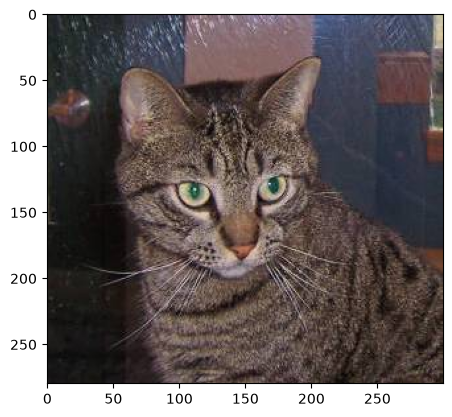

In [92]:
img = image.load_img("/Users/ansh/Desktop/CNN/Training/cats/cat.1.jpg")
plt.imshow(img)

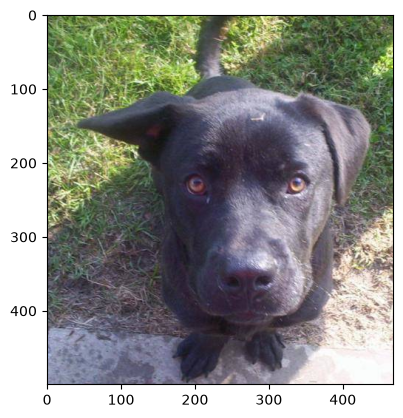

In [93]:
img = image.load_img(r"/Users/ansh/Desktop/CNN/Testing/dog.8.jpg" )
plt.imshow(img)

In [94]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,
    zoom_range=0.1,
    horizontal_flip=True
)

validation = ImageDataGenerator(
    rescale=1./255
)

In [95]:
tr_location = r"/Users/ansh/Desktop/CNN/Training"  
val_location = r"/Users/ansh/Desktop/CNN/validation"

In [96]:
train_data = train.flow_from_directory(tr_location,
                                      target_size=(200,200),
                                      batch_size= 32,
                                      class_mode= "binary")
valid_data = validation.flow_from_directory(val_location,
                                      target_size=(200,200),
                                      batch_size= 32,
                                      class_mode= "binary")

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [97]:
train_data.class_indices

{'cats': 0, 'dogs': 1}

In [98]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras.layers import Dense, Dropout, Flatten

model = Sequential([

    Conv2D(32,(3,3),activation='relu',input_shape=(200,200,3)),
    MaxPooling2D(2,2),

    Conv2D(64,(3,3),activation='relu'),
    MaxPooling2D(2,2),

    Conv2D(128,(3,3),activation='relu'),
    MaxPooling2D(2,2),

    Conv2D(128,(3,3),activation='relu'),
    MaxPooling2D(2,2),

    Flatten(),

    Dense(256,activation='relu'),
    Dropout(0.5),

    Dense(1,activation='sigmoid')
])

model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

NameError: name 'Adam' is not defined

In [99]:

model.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_28 (Conv2D)              │ (None, 198, 198, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_28 (MaxPooling2D) │ (None, 99, 99, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 97, 97, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_29 (MaxPooling2D) │ (None, 48, 48, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_30 (Conv2D)              │ (None, 46, 46, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_30 (MaxPooling2D) │ (None, 23, 23, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_31 (Conv2D)              │ (None, 21, 21, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_31 (MaxPooling2D) │ (None, 10, 10, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 256)            │     3,277,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,518,145 (13.42 MB)

 Trainable params: 3,518,145 (13.42 MB)

 Non-trainable params: 0 (0.00 B)

In [100]:
from tensorflow.keras.optimizers import Adam

model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='binary_crossentropy',
    metrics=['accuracy']
)

In [101]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

early_stop = EarlyStopping(
    monitor='val_accuracy',
    patience=5,
    restore_best_weights=True
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=2,
    verbose=1,
    min_lr=1e-6
)

In [102]:
history = model.fit(
    train_data,
    validation_data=valid_data,
    epochs=30,
    callbacks=[early_stop, reduce_lr]
)

Epoch 1/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 9s 121ms/step - accuracy: 0.5250 - loss: 0.6916 - val_accuracy: 0.5960 - val_loss: 0.6769 - learning_rate: 1.0000e-04
Epoch 2/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 110ms/step - accuracy: 0.5830 - loss: 0.6713 - val_accuracy: 0.6270 - val_loss: 0.6467 - learning_rate: 1.0000e-04
Epoch 3/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 112ms/step - accuracy: 0.6110 - loss: 0.6503 - val_accuracy: 0.6600 - val_loss: 0.6104 - learning_rate: 1.0000e-04
Epoch 4/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - accuracy: 0.6645 - loss: 0.6134 - val_accuracy: 0.6810 - val_loss: 0.5962 - learning_rate: 1.0000e-04
Epoch 5/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 7s 114ms/step - accuracy: 0.6815 - loss: 0.5920 - val_accuracy: 0.6810 - val_loss: 0.5677 - learning_rate: 1.0000e-04
Epoch 6/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 8s 129ms/step - accuracy: 0.7085 - loss: 0.5789 - val_accuracy: 0.6920 - val_loss: 0.5655 - learning_rate: 1.0000e-04
Epoch 7/30
63/63 ━━━━━━━━━━━━━━━━━━━━ 8s 126ms/step - accuracy: 

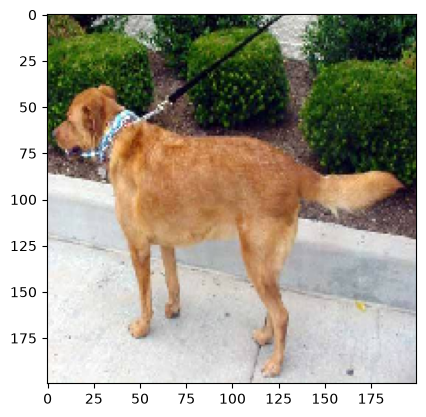

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


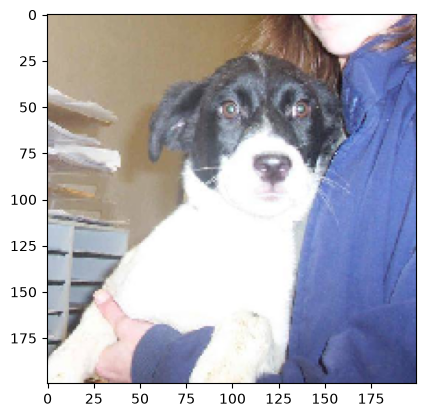

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
cat


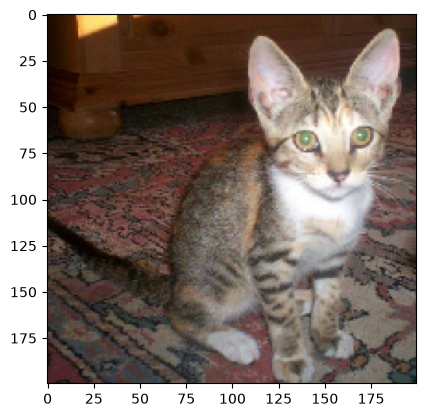

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


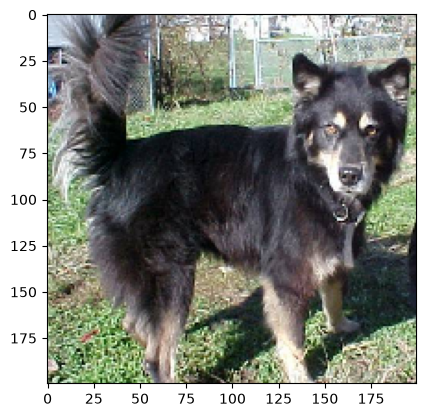

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
dog


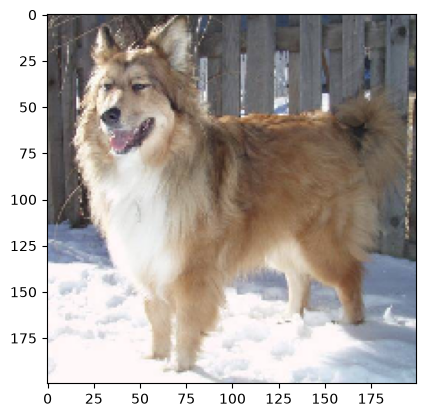

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
cat


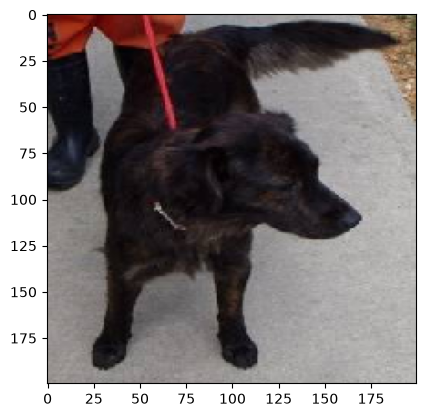

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


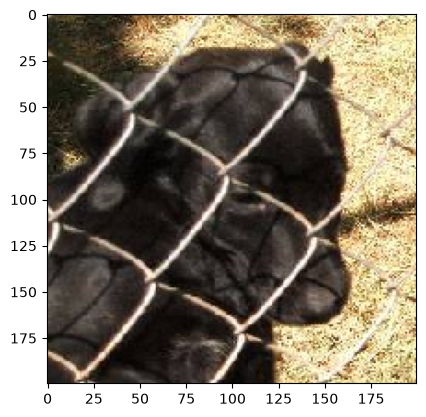

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
dog


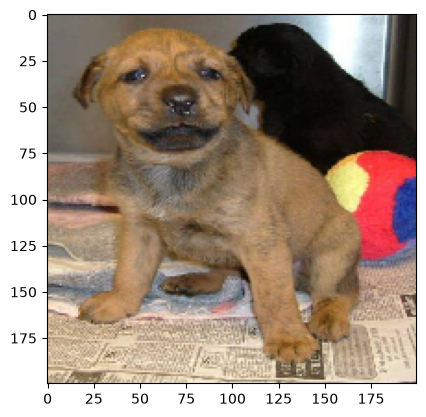

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
dog


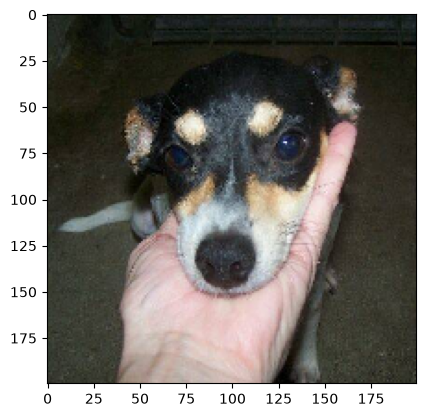

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
dog


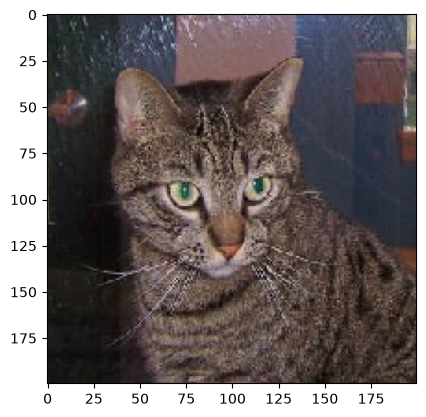

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
cat


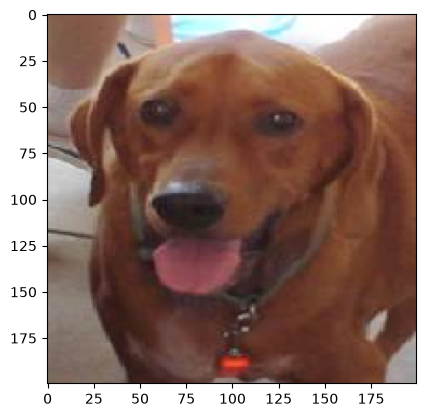

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
dog


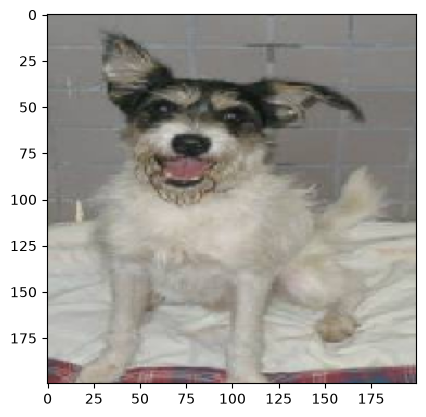

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
cat


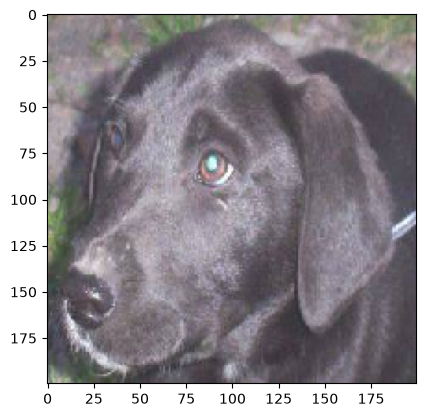

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
cat


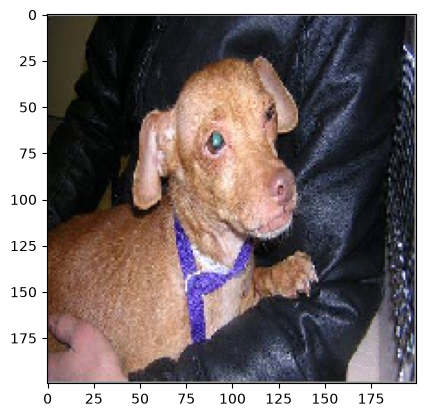

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
dog


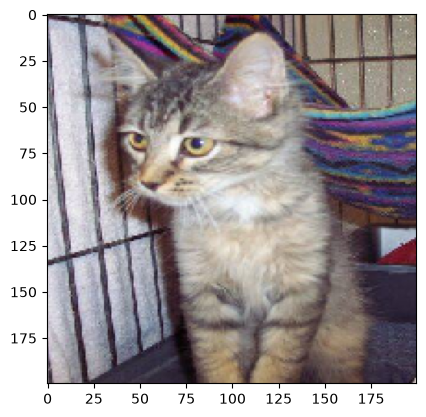

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
cat


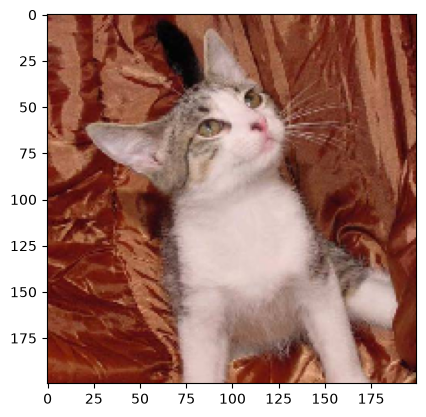

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
cat


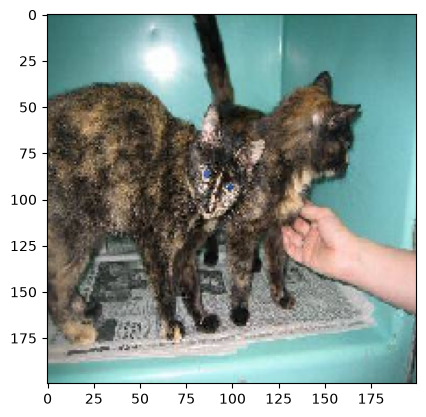

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
dog


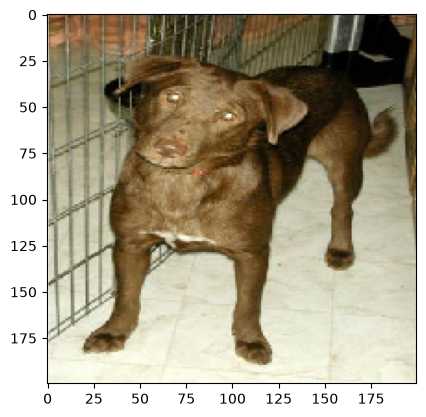

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


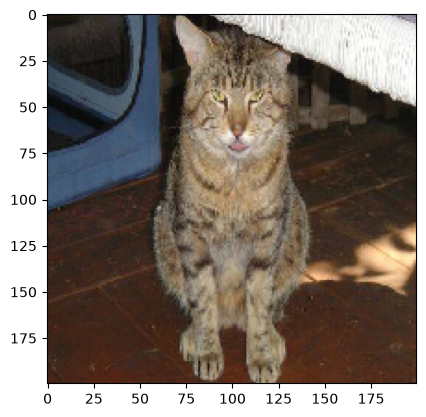

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
cat


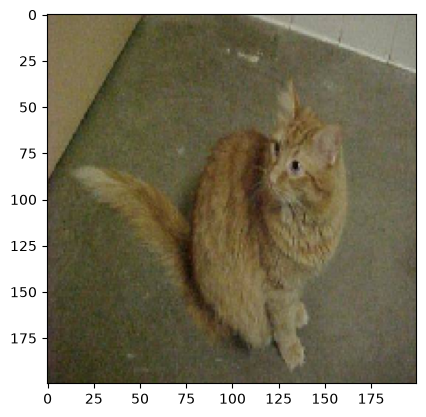

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


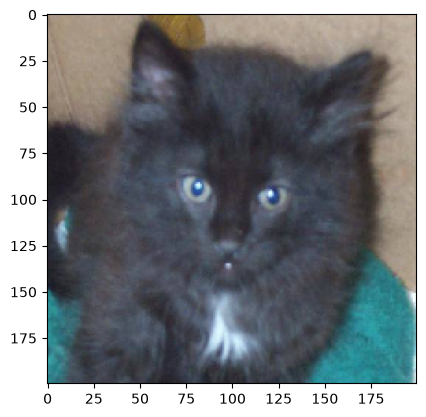

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


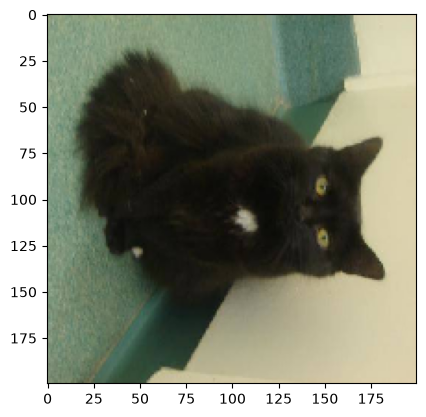

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


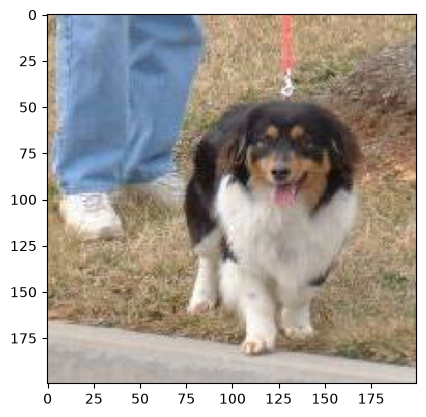

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
dog


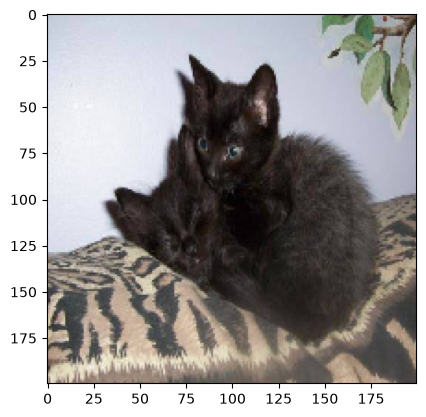

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
dog


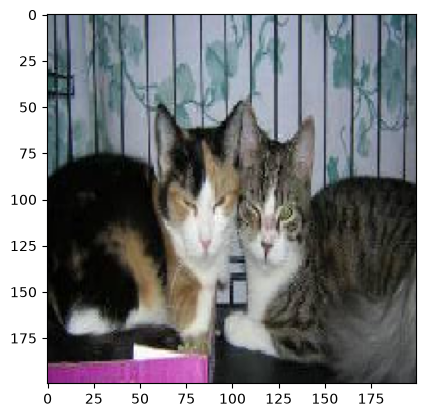

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
cat


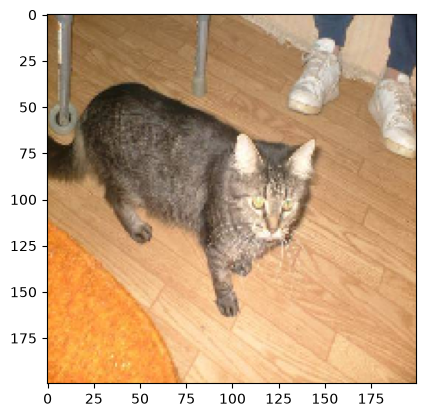

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
cat


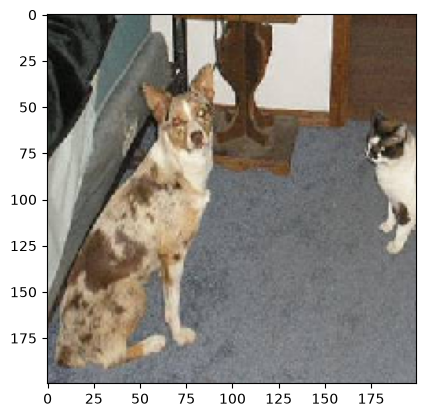

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
dog


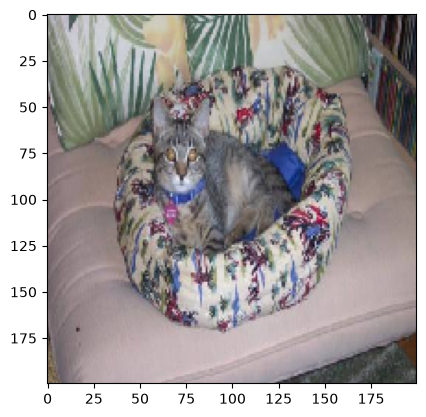

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


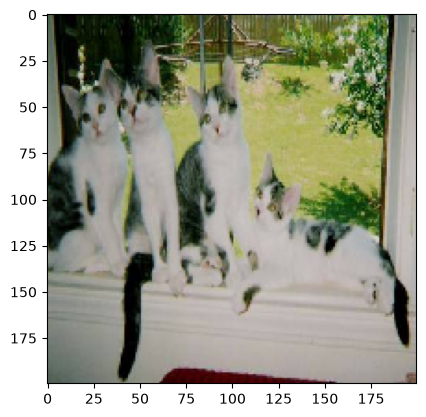

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


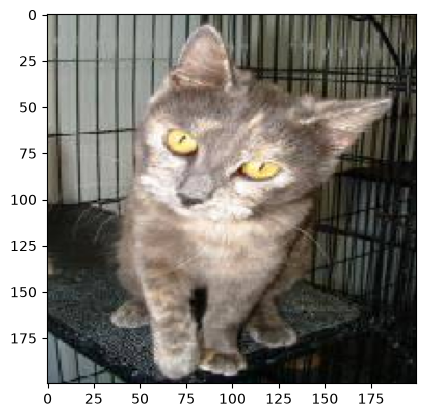

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
cat


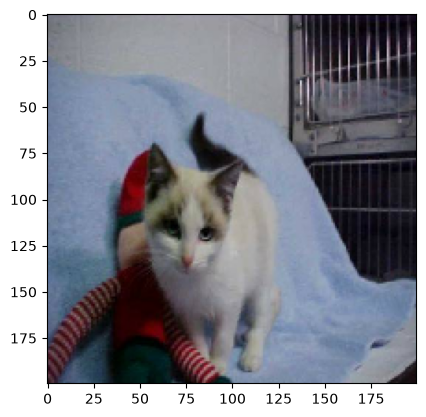

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
dog


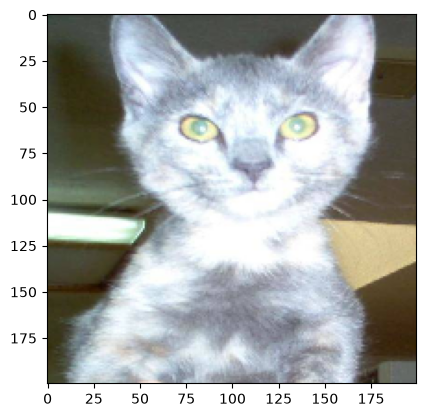

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
cat


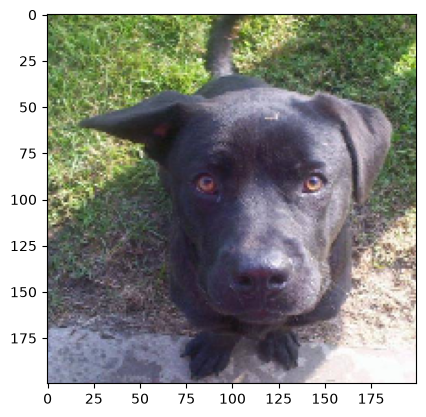

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


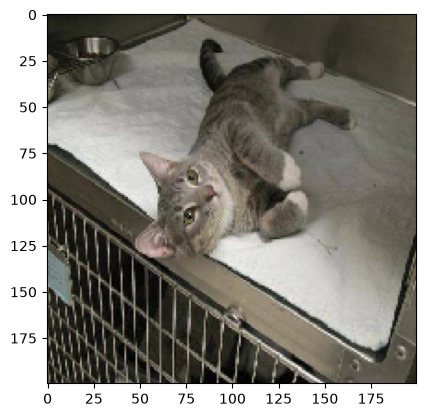

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
cat


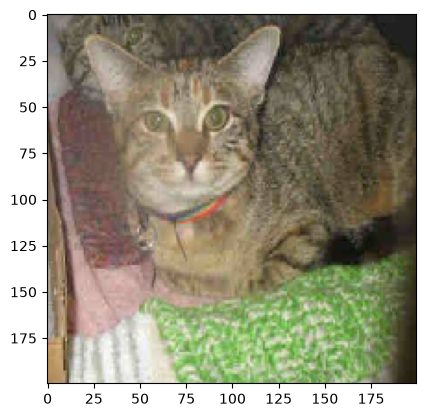

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
cat


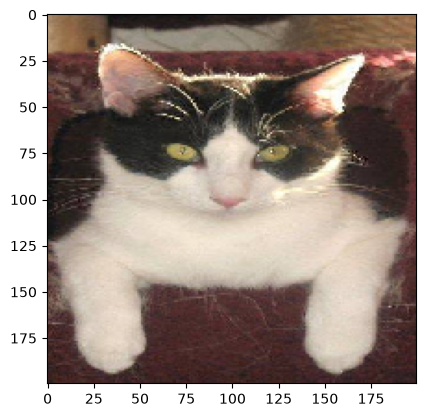

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
cat


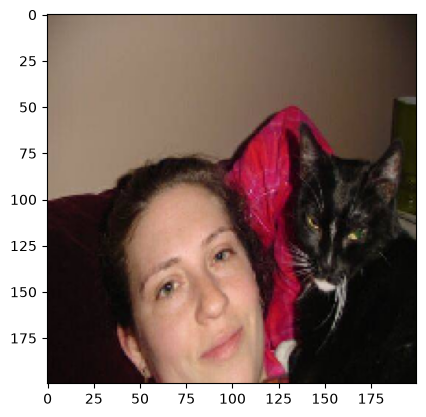

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


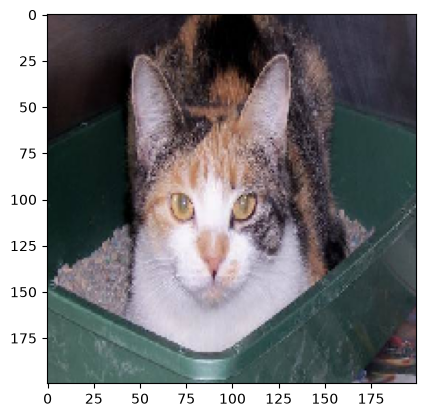

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
cat


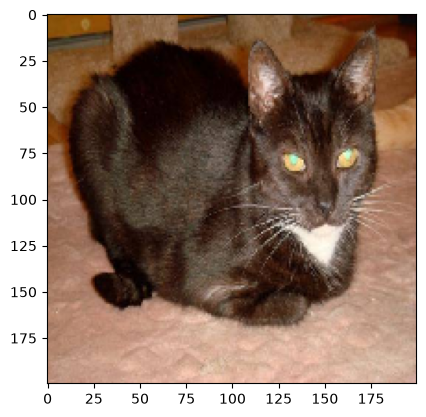

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
cat


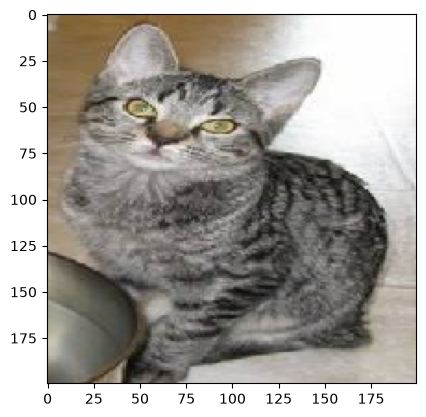

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
cat


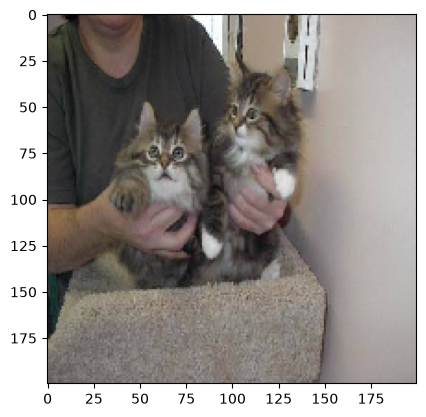

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
cat


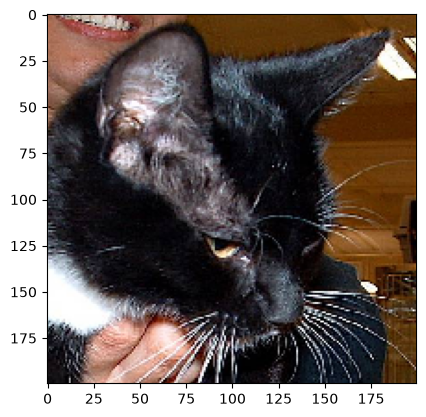

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


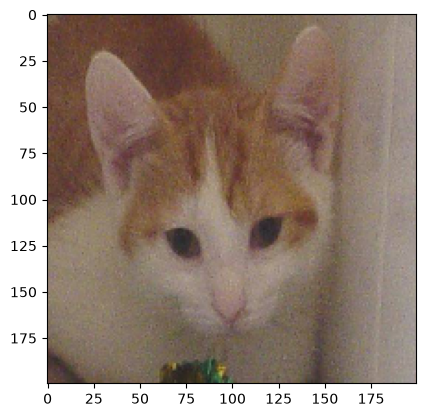

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


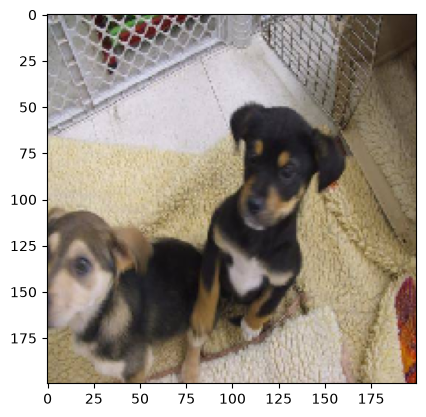

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


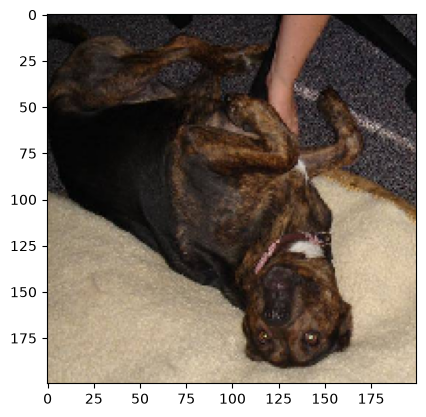

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
dog


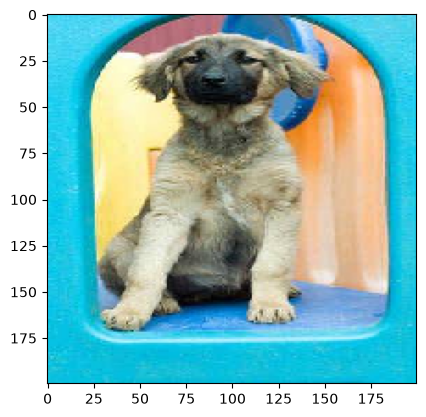

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
cat


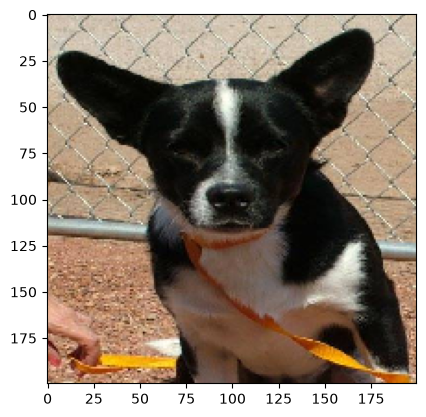

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
dog


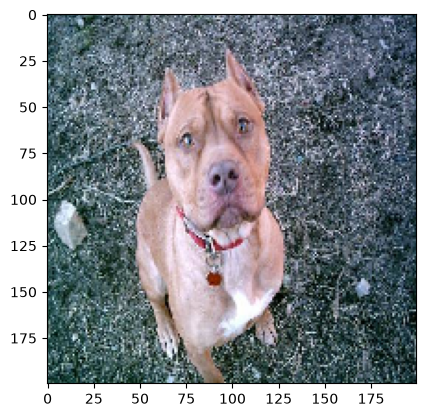

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


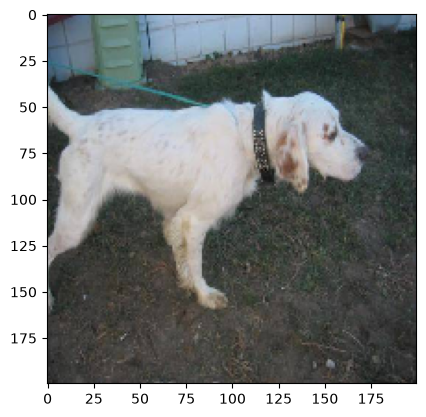

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


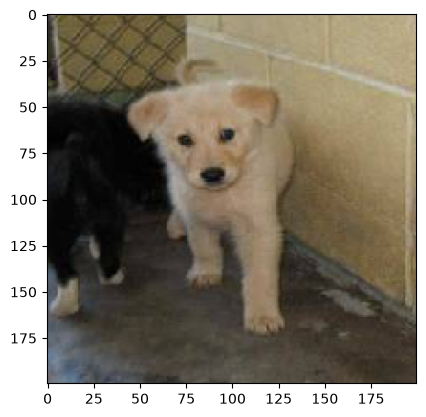

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


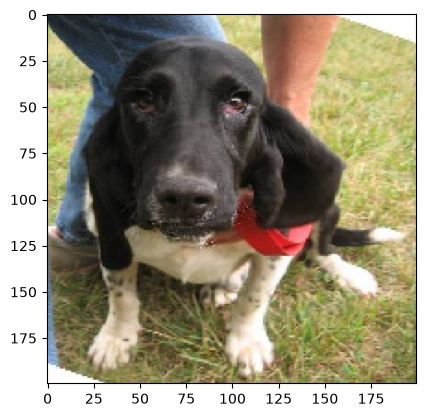

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


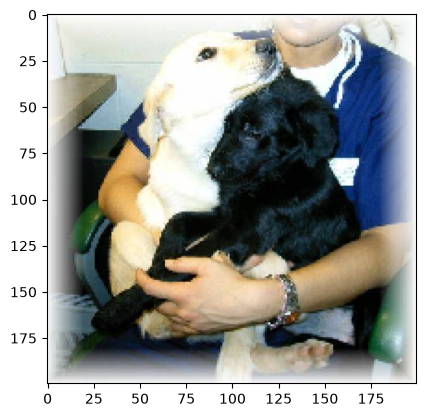

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


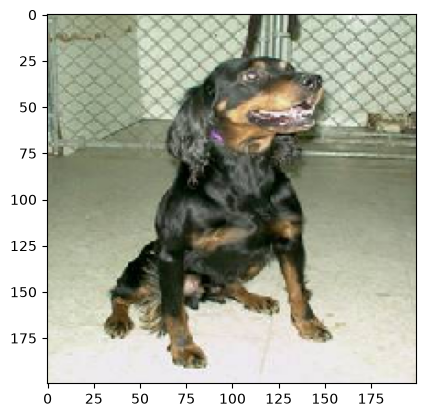

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


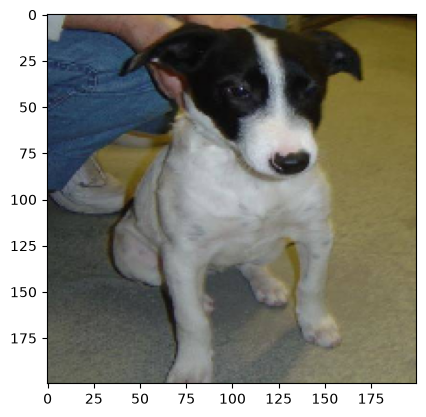

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


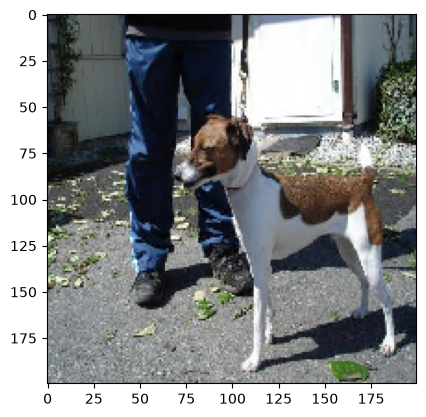

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


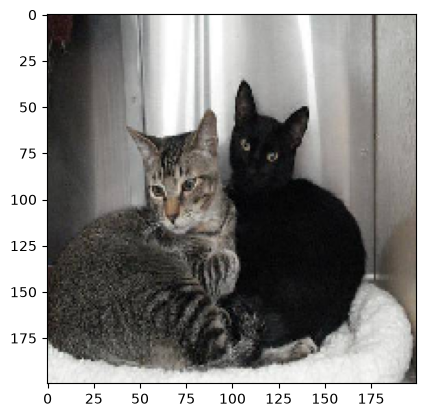

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
dog


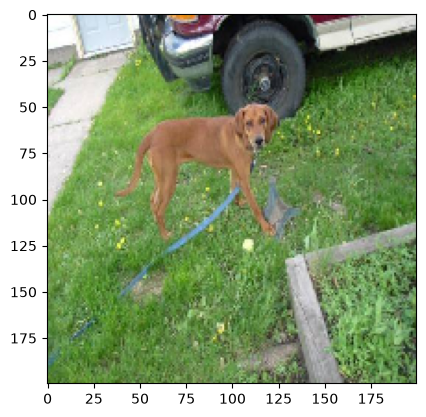

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
dog


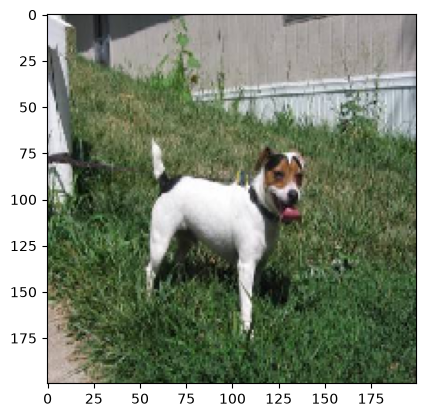

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
dog


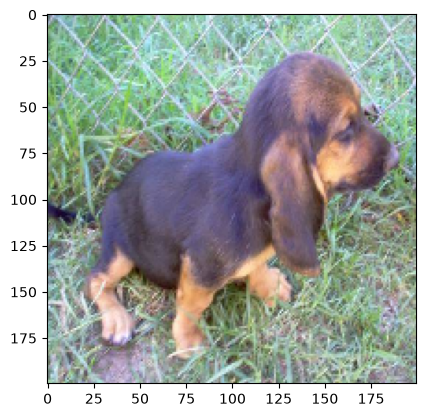

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
dog


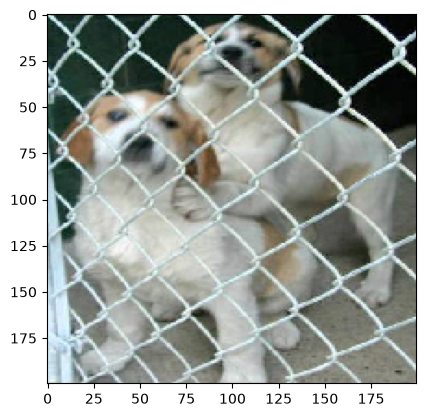

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
dog


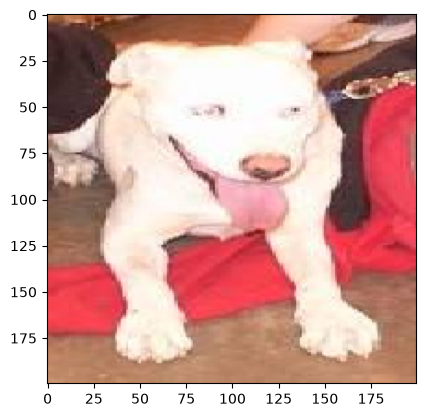

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
dog


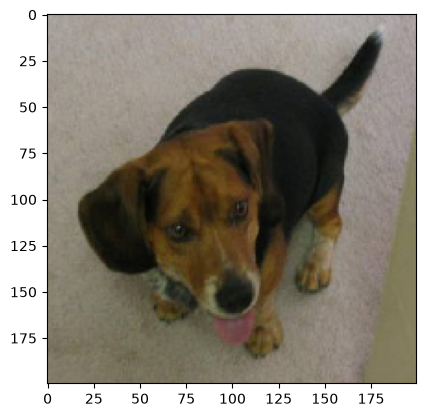

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
dog


In [105]:
path = r"/Users/ansh/Desktop/CNN/Testing"
for i in os.listdir(path):
    img = image.load_img(path+"/"+i,target_size=(200,200))
    plt.imshow(img)
    plt.show()
    
    x = image.img_to_array(img)
    x = np.expand_dims(x,axis = 0)
    pic = np.vstack([x])
    val = model.predict(pic)
    if val==0:
        print("cat")
    else:
        print("dog")

In [104]:
print(model.input_shape)
print(model.summary())

(None, 200, 200, 3)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_28 (Conv2D)              │ (None, 198, 198, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_28 (MaxPooling2D) │ (None, 99, 99, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 97, 97, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_29 (MaxPooling2D) │ (None, 48, 48, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_30 (Conv2D)              │ (None, 46, 46, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_30 (MaxPooling2D) │ (None, 23, 23, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_31 (Conv2D)              │ (None, 21, 21, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_31 (MaxPooling2D) │ (None, 10, 10, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 256)            │     3,277,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 10,554,437 (40.26 MB)

 Trainable params: 3,518,145 (13.42 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 7,036,292 (26.84 MB)

None


In [107]:
model.save("cats_dogs_model.keras")


size_mb = os.path.getsize("cats_dogs_model.keras") / (1024 * 1024)

print(f"Model Size: {size_mb:.2f} MB")



Model Size: 40.31 MB
